In [5]:
#!cd kidney_data/k185mtx/;gunzip matrix.mtx.gz

In [1]:

!mkdir write_185


In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt


In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, facecolor='white')



/home/bioinformatics/miniconda3/envs/MSIA/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.23.1 scipy==1.9.1 pandas==1.4.3 scikit-learn==1.1.2 statsmodels==0.13.2 python-igraph==0.10.1 pynndescent==0.5.7


In [4]:
results_file1 = 'write_185/kidney1.h5ad'  # the file that will store the analysis results



In [5]:
adata = sc.read_10x_mtx(
    'kidney_data/k185mtx/',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading



... writing an h5ad cache file to speedup reading next time


In [6]:
adata.var_names_make_unique()  # this is unnecessary if using `var_names='gene_ids'` in `sc.read_10x_mtx`

In [7]:
adata

AnnData object with n_obs × n_vars = 2486 × 33538
    var: 'gene_ids'

normalizing counts per cell
    finished (0:00:00)


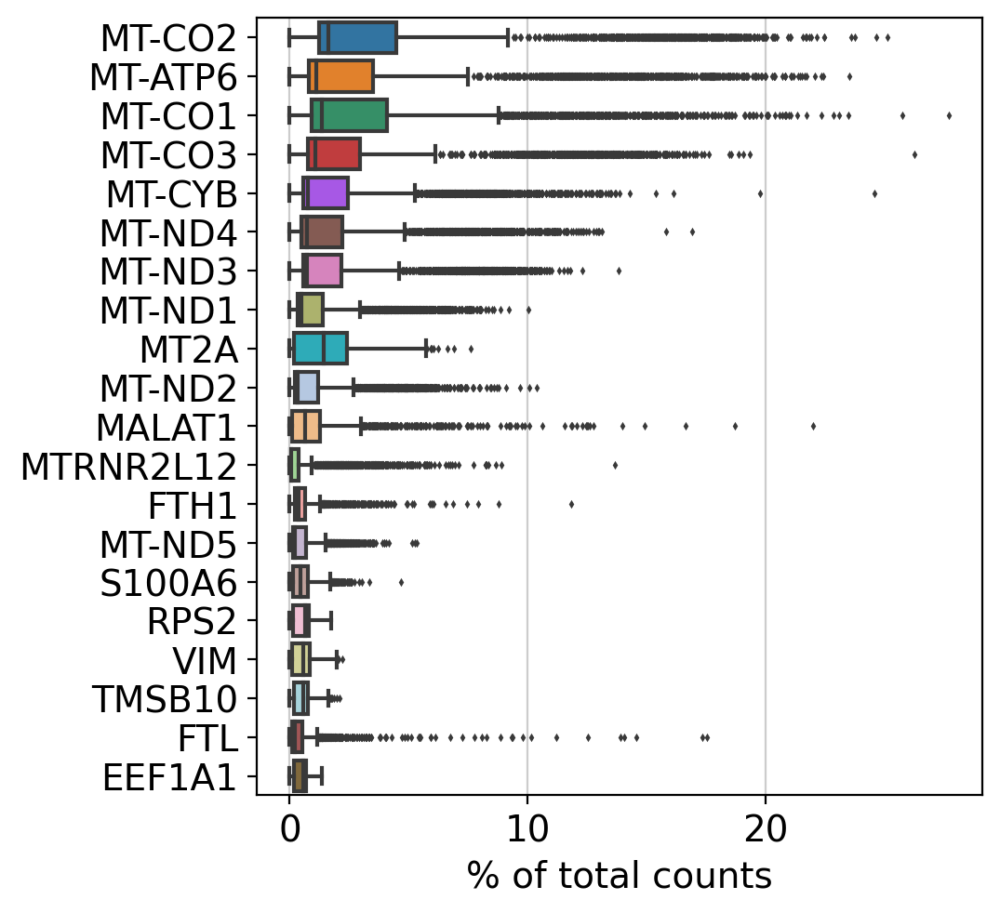

In [8]:
sc.pl.highest_expr_genes(adata, n_top=20, )



In [9]:
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.filter_genes(adata, min_cells=3)

filtered out 472 cells that have less than 200 genes expressed
filtered out 13728 genes that are detected in less than 3 cells


In [10]:
adata.var['mt'] = adata.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

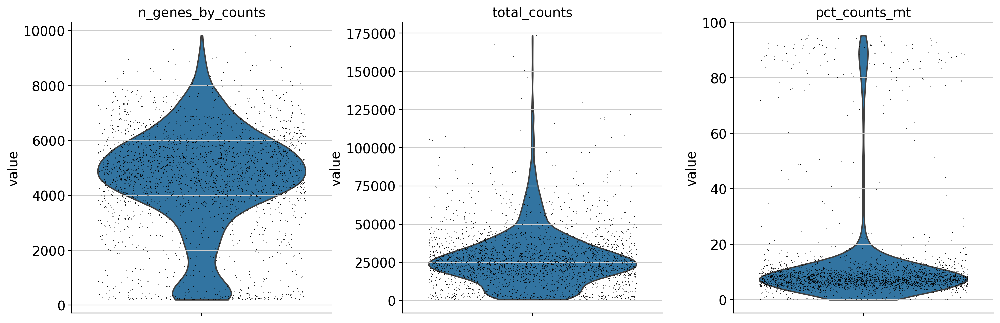

In [11]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

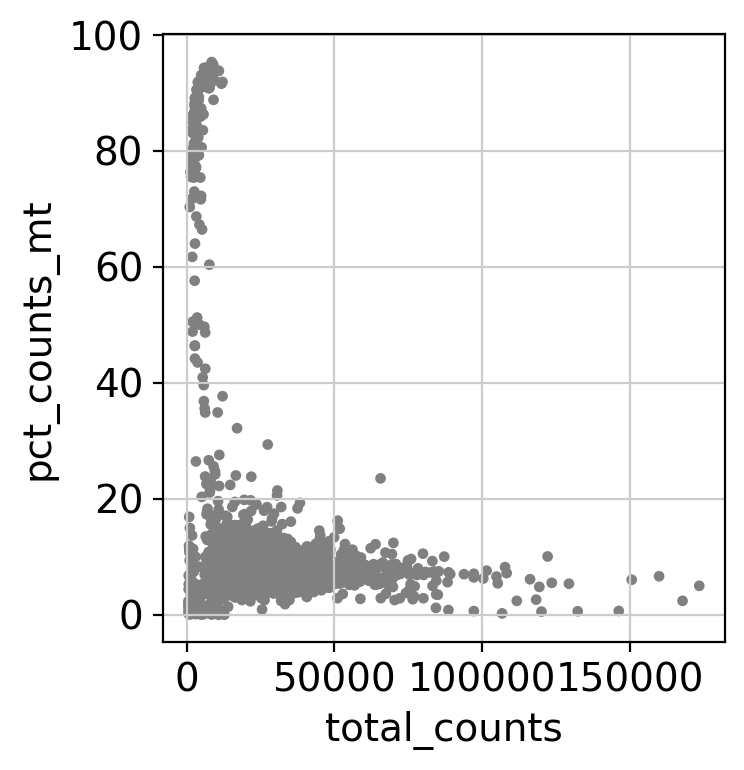

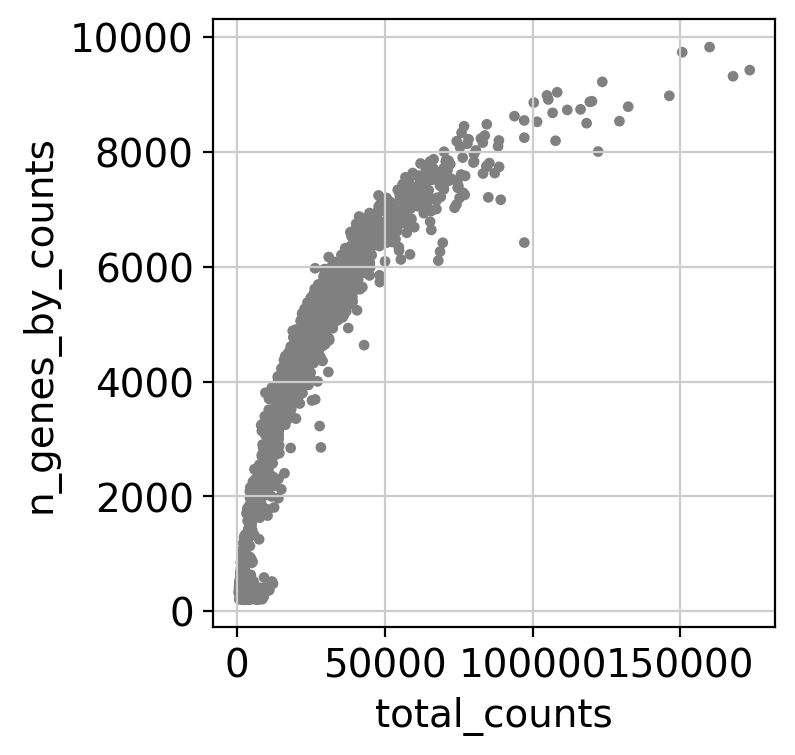

In [12]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt')
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts')



In [13]:
adata = adata[adata.obs.n_genes_by_counts < 9000, :]
adata = adata[adata.obs.pct_counts_mt < 20, :]



In [14]:
sc.pp.normalize_total(adata, target_sum=1e5)

normalizing counts per cell
    finished (0:00:00)


/home/bioinformatics/miniconda3/envs/MSIA/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [15]:
sc.pp.log1p(adata)

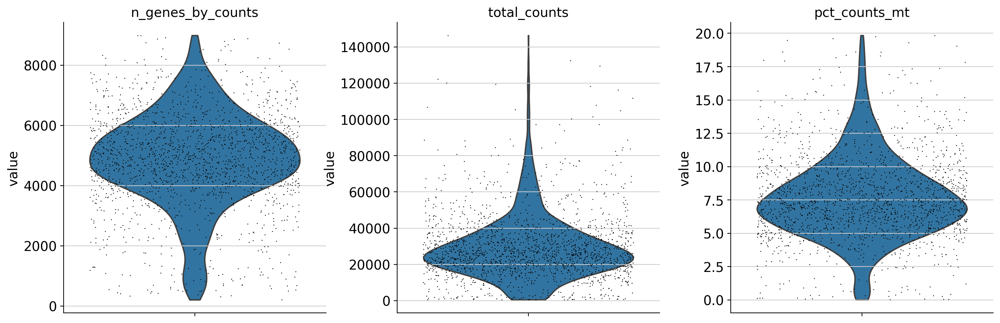

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [17]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)



extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


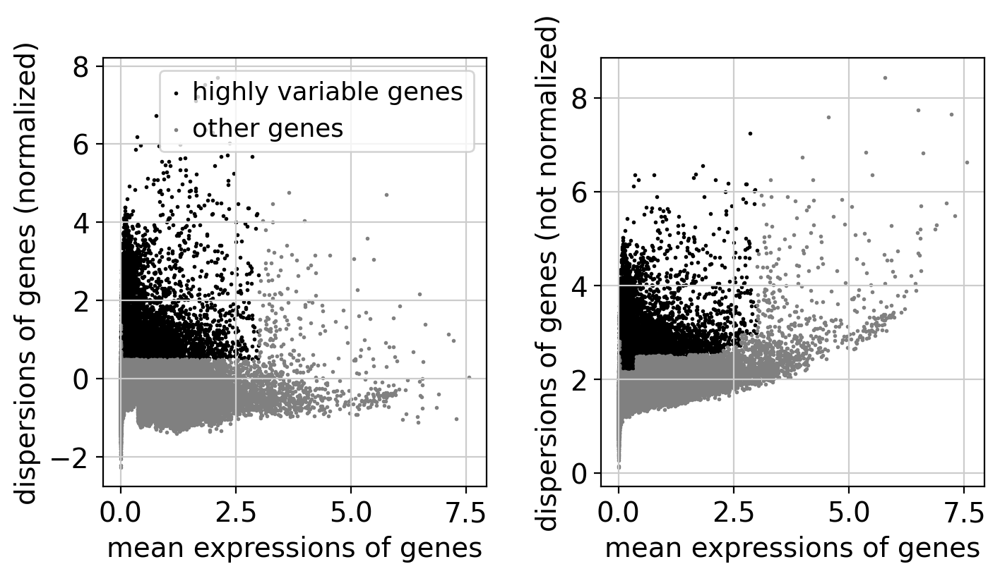

In [18]:
sc.pl.highly_variable_genes(adata)



In [19]:
adata.raw = adata

In [20]:
adata = adata[:, adata.var.highly_variable]


In [21]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt'])



regressing out ['total_counts', 'pct_counts_mt']
    sparse input is densified and may lead to high memory use
    finished (0:00:11)


In [22]:
sc.pp.scale(adata, max_value=10)

In [23]:
sc.tl.pca(adata, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


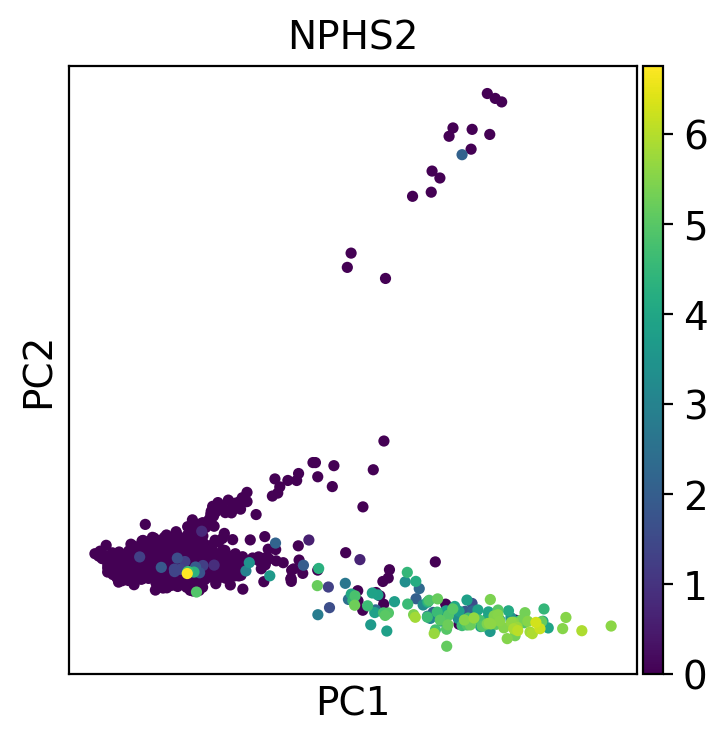

In [24]:
sc.pl.pca(adata, color='NPHS2')



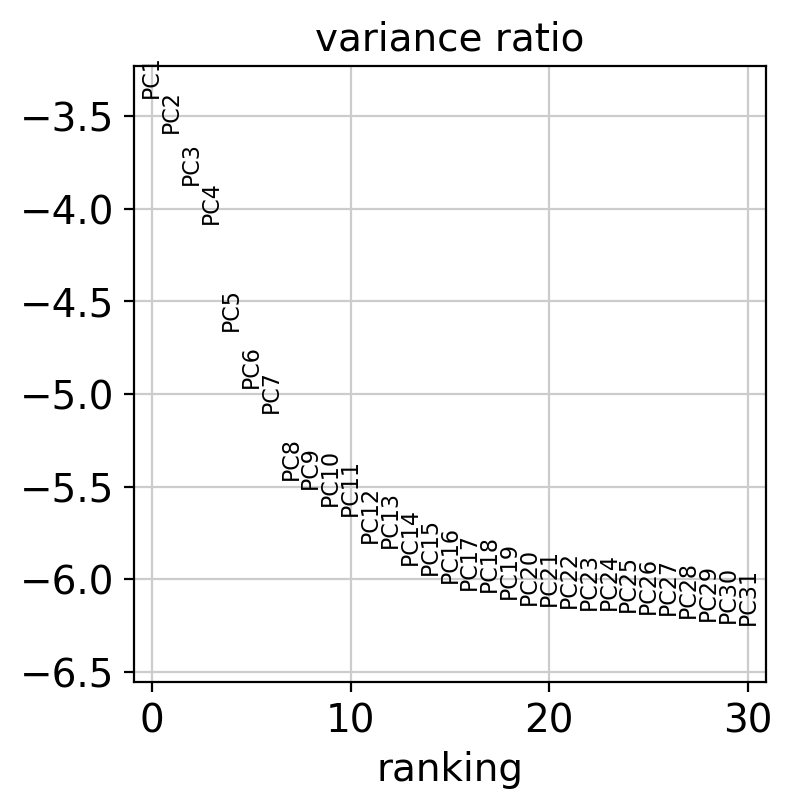

In [25]:
sc.pl.pca_variance_ratio(adata, log=True)



In [29]:
adata.write(results_file1)
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)


computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [27]:
#sc.pp.neighbors(adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [30]:
sc.tl.umap(adata)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


In [31]:
import leidenalg

In [32]:
sc.tl.leiden(adata, resolution=1)

running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


In [33]:
adata


AnnData object with n_obs × n_vars = 1845 × 3964
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [34]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=20)

computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [32]:
#import seaborn as sns
#from sklearn.neighbors import NearestNeighbors 
#from sklearn.neighbors import DistanceMetric
#from sklearn.decomposition import PCA

In [35]:
sc.tl.umap(adata)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


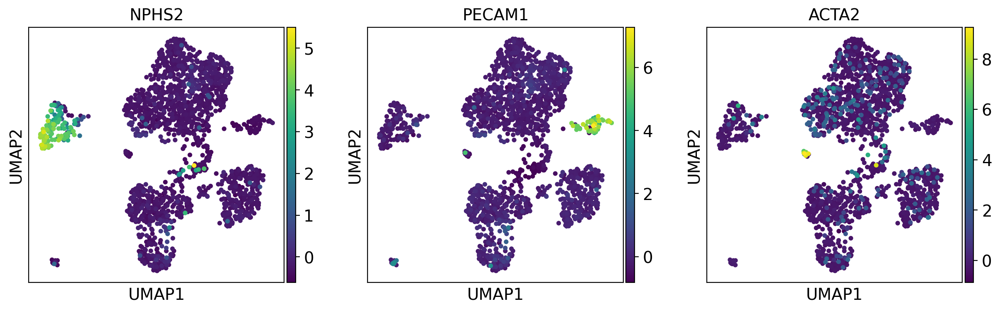

In [36]:
sc.pl.umap(adata, color=['NPHS2', 'PECAM1', 'ACTA2'], use_raw=False)

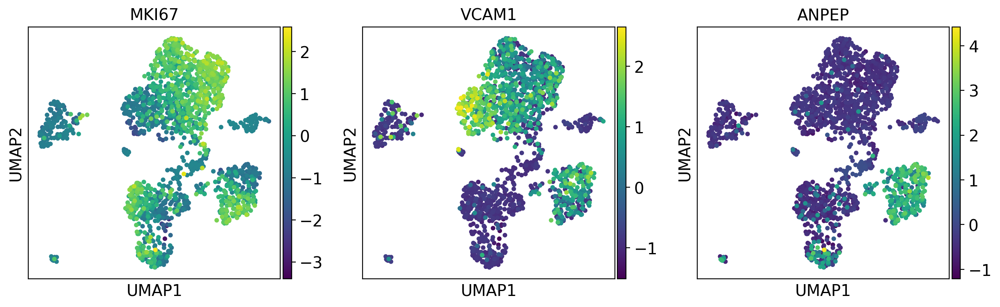

In [37]:
sc.pl.umap(adata, color=['MKI67', 'VCAM1', 'ANPEP'], use_raw=False)

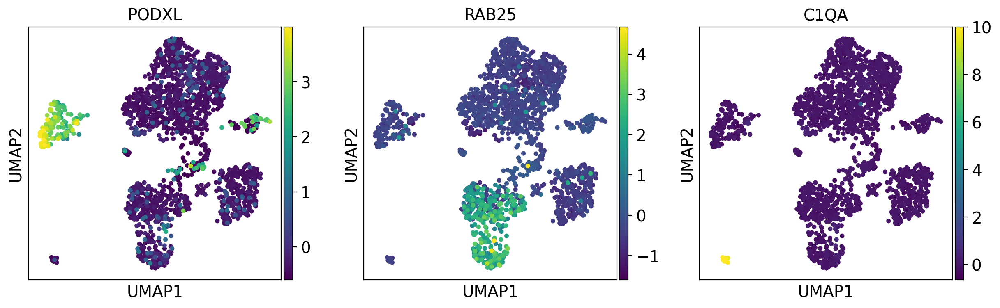

In [39]:
sc.pl.umap(adata, color=['PODXL', 'RAB25', 'C1QA'], use_raw=False)

In [40]:
sc.tl.leiden(adata)



running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


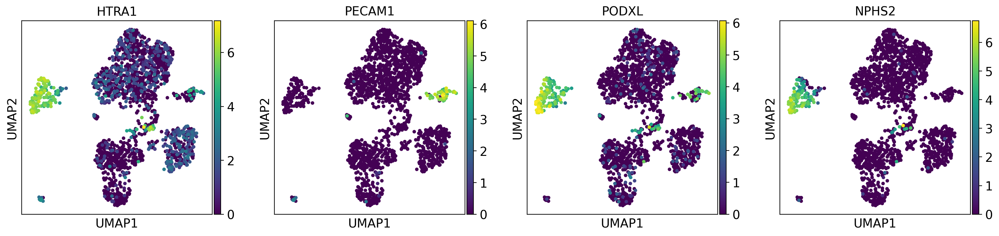

In [41]:
sc.pl.umap(adata, color=['HTRA1', 'PECAM1', 'PODXL', 'NPHS2'])

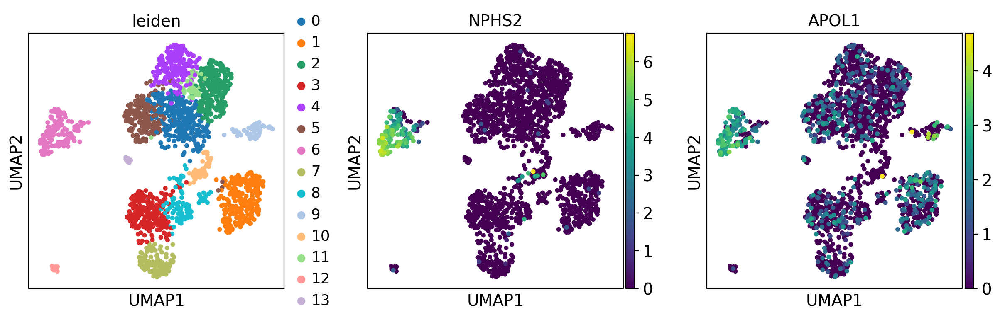

In [42]:
sc.pl.umap(adata, color=['leiden', 'NPHS2', 'APOL1'])

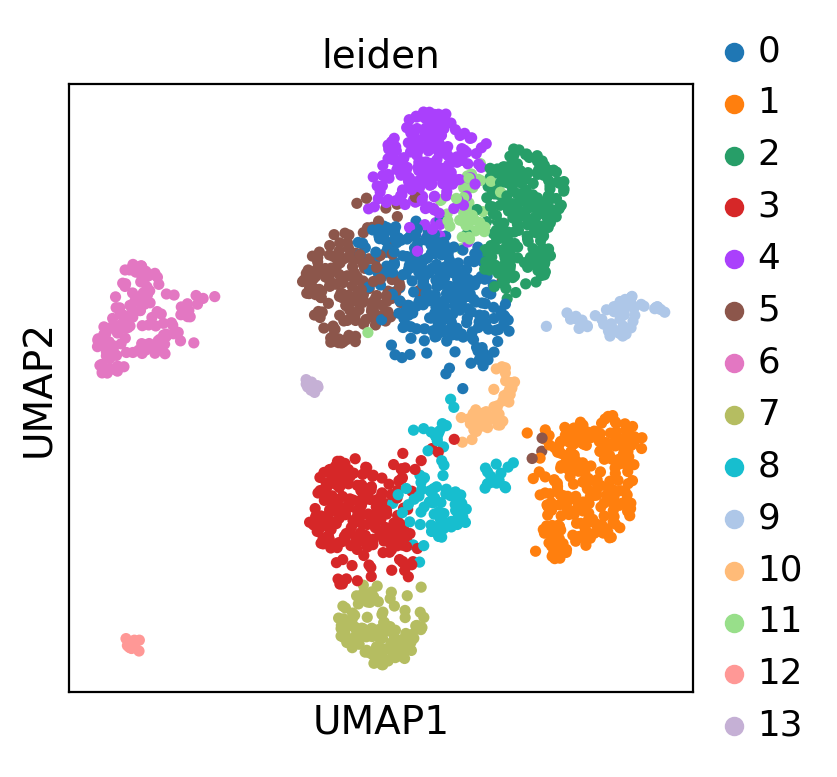

In [43]:
sc.pl.umap(adata, color=['leiden'])

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


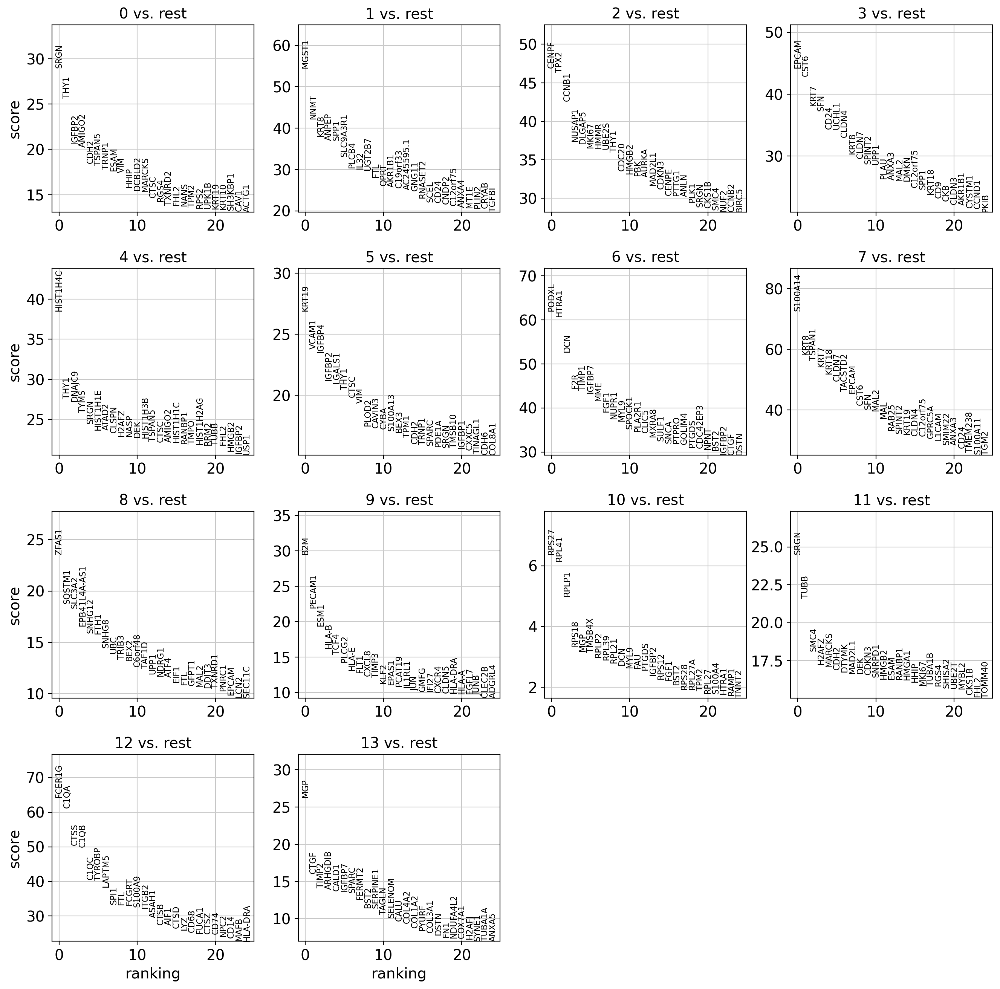

In [44]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [47]:
sc.settings.verbosity = 2  # reduce the verbosity

ranking genes
    finished (0:00:03)


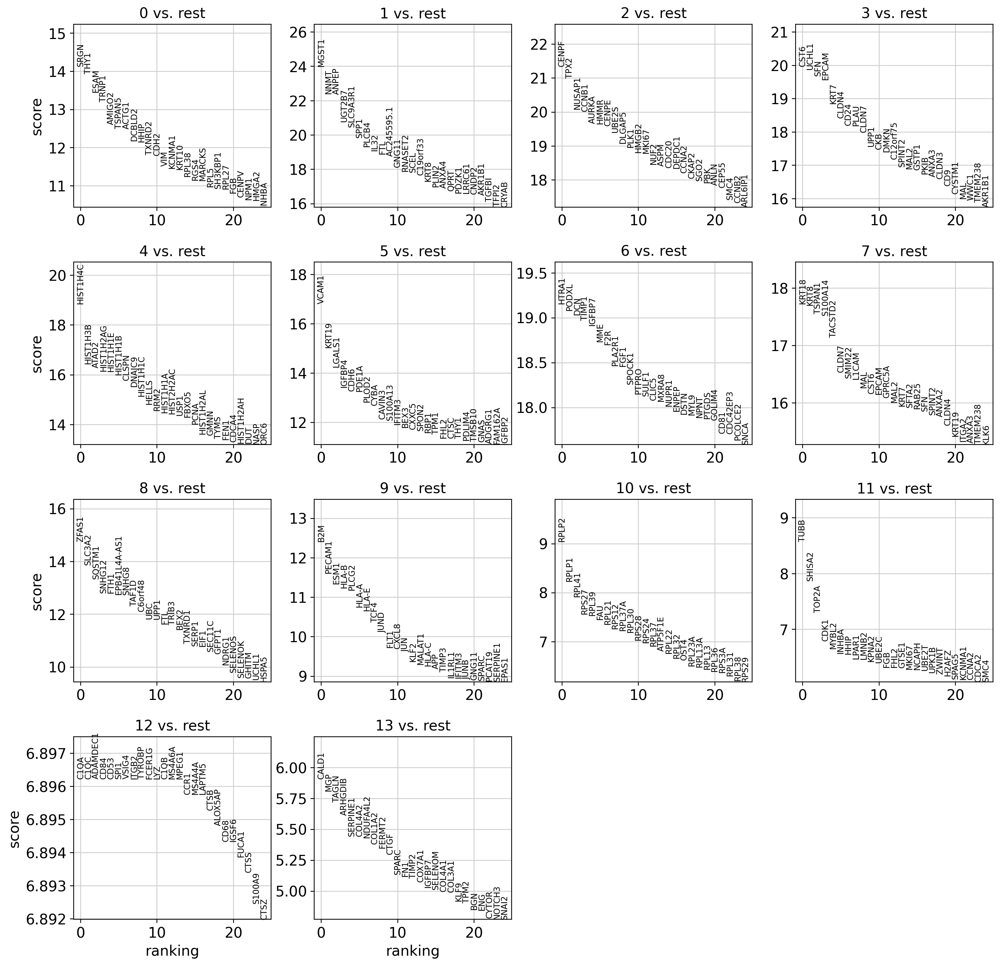

In [48]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


In [56]:
#sc.tl.rank_genes_groups(adata, 'leiden', method='logreg')
#sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [49]:
adata.write(results_file1)

In [68]:
#marker_genes = ['HHIP', 'VCAM1', 'ANPEP', 'RAB25', 'NPHS2', 'PODXL', 'PECAM1', 'C1QA','MTRNR2L12']

In [50]:
adata = sc.read(results_file1)



In [51]:
adata

AnnData object with n_obs × n_vars = 1845 × 3964
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [52]:
pd.DataFrame(adata.uns['rank_genes_groups']['names']).head(30)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,SRGN,MGST1,CENPF,CST6,HIST1H4C,VCAM1,HTRA1,KRT18,ZFAS1,B2M,RPLP2,TUBB,C1QA,CALD1
1,THY1,NNMT,TPX2,UCHL1,HIST1H3B,KRT19,PODXL,KRT8,SLC3A2,PECAM1,RPLP1,SHISA2,C1QC,MGP
2,ESAM,ANPEP,NUSAP1,SFN,ATAD2,LGALS1,DCN,TSPAN1,SQSTM1,ESM1,RPL41,TOP2A,ADAMDEC1,TAGLN
3,TRNP1,UGT2B7,CCNB1,EPCAM,HIST1H2AG,IGFBP4,TIMP1,S100A14,SNHG12,HLA-B,RPS27,CDK1,CD84,ARHGDIB
4,AMIGO2,SLC9A3R1,AURKA,KRT7,HIST1H1E,CDH6,IGFBP7,TACSTD2,FTH1,PLCG2,RPL39,MYBL2,CD53,SERPINE1
5,TSPAN5,SPP1,HMMR,CLDN4,HIST1H1B,PDE1A,MME,CLDN7,EPB41L4A-AS1,HLA-A,FAU,INHBA,SPI1,COL4A2
6,ACTG1,PLCB4,CENPE,CD24,CLSPN,PLOD2,F2R,SMIM22,SNHG8,HLA-E,RPL21,HHIP,VSIG4,NDUFA4L2
7,DCBLD2,IL32,UBE2S,PLAU,DNAJC9,CYBA,PLA2R1,L1CAM,TAF1D,TCF4,RPS12,LPAR1,ITGB2,COL1A2
8,HHIP,FTL,DLGAP5,CLDN7,HIST1H1C,CAVIN3,FGF1,MAL,C6orf48,JUND,RPL37A,LMNB2,TYROBP,FERMT2
9,TXNRD2,AC245595.1,PLK1,UPP1,HELLS,S100A13,SPOCK1,CST6,UBC,FLT1,RPL30,KPNA2,FCER1G,CTGF


In [53]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names', 'pvals']}).head(60)

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,9_n,9_p,10_n,10_p,11_n,11_p,12_n,12_p,13_n,13_p
0,SRGN,2.633269e-45,MGST1,3.683542e-127,CENPF,5.189429e-101,CST6,1.115932e-88,HIST1H4C,3.119554e-79,...,B2M,2.197319e-35,RPLP2,1.467629e-19,TUBB,9.770074e-18,C1QA,5.340140e-12,CALD1,3.459413e-09
1,THY1,4.105106e-44,NNMT,3.006482e-111,TPX2,7.497877e-98,UCHL1,8.168824e-88,HIST1H3B,1.039533e-60,...,PECAM1,3.795532e-31,RPLP1,1.861216e-16,SHISA2,3.524905e-15,C1QC,5.340140e-12,MGP,6.255978e-09
2,ESAM,3.151215e-41,ANPEP,1.113466e-110,NUSAP1,1.136076e-89,SFN,3.538824e-86,ATAD2,1.277314e-59,...,ESM1,8.343208e-30,RPL41,2.474761e-15,TOP2A,2.800855e-13,ADAMDEC1,5.340140e-12,TAGLN,1.068224e-08
3,TRNP1,8.383852e-40,UGT2B7,1.196166e-95,CCNB1,3.739305e-89,EPCAM,2.979328e-85,HIST1H2AG,1.057788e-58,...,HLA-B,2.725067e-29,RPS27,4.011598e-14,CDK1,1.090567e-11,CD84,5.340140e-12,ARHGDIB,1.995053e-08
4,AMIGO2,1.964073e-36,SLC9A3R1,6.637352e-93,AURKA,4.749287e-86,KRT7,2.829681e-79,HIST1H1E,1.660019e-58,...,PLCG2,5.154124e-29,RPL39,4.931819e-14,MYBL2,2.791759e-11,CD53,5.340140e-12,SERPINE1,5.196621e-08
5,TSPAN5,7.689812e-36,SPP1,1.636715e-87,HMMR,5.340592e-86,CLDN4,8.626660e-76,HIST1H1B,1.243584e-57,...,HLA-A,6.016597e-27,FAU,9.401444e-14,INHBA,5.111318e-11,SPI1,5.340140e-12,COL4A2,5.260476e-08
6,ACTG1,8.414980e-36,PLCB4,4.223896e-83,CENPE,1.727810e-85,CD24,5.121969e-74,CLSPN,3.973111e-56,...,HLA-E,1.536932e-26,RPL21,1.885915e-13,HHIP,5.540501e-11,VSIG4,5.340140e-12,NDUFA4L2,5.642665e-08
7,DCBLD2,4.208906e-34,IL32,2.877688e-81,UBE2S,9.044053e-84,PLAU,6.089031e-74,DNAJC9,2.064472e-54,...,TCF4,3.465589e-25,RPS12,3.781773e-13,LPAR1,9.722401e-11,ITGB2,5.340140e-12,COL1A2,7.413759e-08
8,HHIP,5.480865e-34,FTL,1.132398e-79,DLGAP5,3.607752e-81,CLDN7,2.363700e-72,HIST1H1C,7.732508e-52,...,JUND,5.852596e-24,RPL37A,5.093148e-13,LMNB2,1.014104e-10,TYROBP,5.340140e-12,FERMT2,8.882060e-08
9,TXNRD2,3.480959e-32,AC245595.1,1.783340e-78,PLK1,3.670158e-80,UPP1,5.493117e-69,HELLS,1.185232e-49,...,FLT1,2.425347e-22,RPL30,6.600845e-13,KPNA2,1.323660e-10,FCER1G,5.340140e-12,CTGF,1.172908e-07


In [54]:
result = adata.uns['rank_genes_groups']
groups = result['names'].dtype.names
dataframe = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','logfoldchanges','pvals_adj']}).head(60)

In [55]:
dataframe

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p,3_n,...,10_p,11_n,11_l,11_p,12_n,12_l,12_p,13_n,13_l,13_p
0,SRGN,2.888374,5.216506e-41,MGST1,3.362478,7.297097e-123,CENPF,3.946029,1.028026e-96,CST6,...,6.607667e-17,TUBB,1.230560,1.935452e-13,C1QA,19.150206,3.807409e-09,CALD1,3.473591,0.000062
1,THY1,2.818698,4.066108e-40,NNMT,4.921354,2.977921e-107,TPX2,3.410638,7.426648e-94,UCHL1,...,2.751544e-14,SHISA2,2.829383,3.491418e-11,C1QC,37.354202,3.807409e-09,MGP,8.526412,0.000062
2,ESAM,2.053264,2.080853e-37,ANPEP,5.953279,7.352584e-107,NUSAP1,3.078820,7.501892e-86,SFN,...,2.816769e-13,TOP2A,2.964374,1.849498e-09,ADAMDEC1,34.663708,3.807409e-09,TAGLN,6.863823,0.000071
3,TRNP1,1.507929,4.152103e-36,UGT2B7,3.704608,4.739212e-92,CCNB1,3.336828,1.851891e-85,EPCAM,...,3.191556e-12,CDK1,2.723360,5.401031e-08,CD84,13.143986,3.807409e-09,ARHGDIB,4.408008,0.000099
4,AMIGO2,2.134010,7.781657e-33,SLC9A3R1,2.520515,2.191432e-89,AURKA,3.839559,1.763285e-82,KRT7,...,3.801530e-12,MYBL2,2.045437,1.106095e-07,CD53,34.633732,3.807409e-09,SERPINE1,4.731397,0.000124
5,TSPAN5,1.871077,2.381439e-32,SPP1,3.804404,4.631903e-84,HMMR,3.542896,1.763285e-82,CLDN4,...,6.422159e-12,INHBA,2.590262,1.567962e-07,SPI1,11.025232,3.807409e-09,COL4A2,2.829046,0.000124
6,ACTG1,0.721275,2.381439e-32,PLCB4,3.423748,9.297265e-80,CENPE,3.846279,4.889702e-82,CD24,...,1.189808e-11,HHIP,2.597663,1.567962e-07,VSIG4,16.098003,3.807409e-09,NDUFA4L2,8.900730,0.000124
7,DCBLD2,1.194972,1.042230e-30,IL32,3.192865,5.700699e-78,UBE2S,2.377482,2.239534e-80,PLAU,...,2.190553e-11,LPAR1,2.363941,2.232156e-07,ITGB2,11.714144,3.807409e-09,COL1A2,8.297806,0.000147
8,HHIP,2.212059,1.206399e-30,FTL,1.619920,2.039345e-76,DLGAP5,3.251040,7.941064e-78,CLDN7,...,2.866343e-11,LMNB2,1.905849,2.232156e-07,TYROBP,16.189905,3.807409e-09,FERMT2,2.726150,0.000160
9,TXNRD2,1.677879,6.895779e-29,AC245595.1,2.517880,2.943998e-75,PLK1,3.704887,7.270582e-77,UPP1,...,3.592383e-11,KPNA2,1.882248,2.622171e-07,FCER1G,14.564877,3.807409e-09,CTGF,4.394797,0.000191


In [45]:
dataframe.to_csv('dftop60_1.csv', index=False)

In [58]:
df1=dataframe.iloc[:, [0,1,2,3,4,5,6,7,8]]
df1

,0_n,0_l,0_p,1_n,1_l,1_p,2_n,2_l,2_p
0,SRGN,2.888374,5.216506e-41,MGST1,3.362478,7.297097e-123,CENPF,3.946029,1.028026e-96
1,THY1,2.818698,4.066108e-40,NNMT,4.921354,2.977921e-107,TPX2,3.410638,7.426648e-94
2,ESAM,2.053264,2.080853e-37,ANPEP,5.953279,7.352584e-107,NUSAP1,3.078820,7.501892e-86
3,TRNP1,1.507929,4.152103e-36,UGT2B7,3.704608,4.739212e-92,CCNB1,3.336828,1.851891e-85
4,AMIGO2,2.134010,7.781657e-33,SLC9A3R1,2.520515,2.191432e-89,AURKA,3.839559,1.763285e-82
5,TSPAN5,1.871077,2.381439e-32,SPP1,3.804404,4.631903e-84,HMMR,3.542896,1.763285e-82
6,ACTG1,0.721275,2.381439e-32,PLCB4,3.423748,9.297265e-80,CENPE,3.846279,4.889702e-82
7,DCBLD2,1.194972,1.042230e-30,IL32,3.192865,5.700699e-78,UBE2S,2.377482,2.239534e-80
8,HHIP,2.212059,1.206399e-30,FTL,1.619920,2.039345e-76,DLGAP5,3.251040,7.941064e-78
9,TXNRD2,1.677879,6.895779e-29,AC245595.1,2.517880,2.943998e-75,PLK1,3.704887,7.270582e-77


In [59]:
df1.to_csv('df1_1.csv', index=False)

In [60]:
df2=dataframe.iloc[:, [9,10,11,12,13,14,15,16,17]]
df2

,3_n,3_l,3_p,4_n,4_l,4_p,5_n,5_l,5_p
0,CST6,4.689504,2.210661e-84,HIST1H4C,3.001124,6.179836e-75,VCAM1,3.753100,4.388991e-59
1,UCHL1,2.859387,8.091221e-84,HIST1H3B,3.470436,1.029658e-56,KRT19,2.476564,4.259229e-47
2,SFN,5.374095,2.336804e-82,ATAD2,2.727339,8.434529e-56,LGALS1,1.008176,3.246739e-42
3,EPCAM,4.378692,1.475512e-81,HIST1H2AG,3.379312,5.238696e-55,IGFBP4,2.485856,2.307264e-37
4,KRT7,4.557289,9.342662e-76,HIST1H1E,2.850708,6.576997e-55,CDH6,3.260741,1.291590e-36
5,CLDN4,4.171707,2.441345e-72,HIST1H1B,4.153507,4.105901e-54,PDE1A,2.893304,1.291590e-36
6,CD24,3.380785,1.268327e-70,CLSPN,2.691622,1.124390e-52,PLOD2,1.748541,2.963040e-34
7,PLAU,3.261500,1.340263e-70,DNAJC9,2.229411,5.112150e-51,CYBA,0.953832,1.746307e-33
8,CLDN7,4.165959,4.682490e-69,HIST1H1C,2.600328,1.702011e-48,CAVIN3,1.435431,1.474971e-30
9,UPP1,2.534693,9.068221e-66,HELLS,2.471131,2.347944e-46,S100A13,0.923389,2.673075e-30


In [61]:
df2.to_csv('df2_1.csv', index=False)

In [62]:
df3=dataframe.iloc[:, [18,19,20,21,22,23,24,25,26]]
df3

,6_n,6_l,6_p,7_n,7_l,7_p,8_n,8_l,8_p
0,HTRA1,8.126574,1.776127e-77,KRT18,4.130222,3.973701e-66,ZFAS1,1.836591,5.084650e-45
1,PODXL,8.837165,3.633577e-77,KRT8,4.795088,3.973701e-66,SLC3A2,2.376460,6.493086e-40
2,DCN,10.621501,6.247954e-77,TSPAN1,5.797884,3.697952e-65,SQSTM1,2.316286,7.693372e-37
3,TIMP1,6.389567,1.418916e-76,S100A14,6.686161,4.920464e-65,SNHG12,3.823085,5.291024e-34
4,IGFBP7,4.098675,3.442019e-76,TACSTD2,5.846974,2.772386e-62,FTH1,1.722777,5.291024e-34
5,MME,8.298346,8.902797e-75,CLDN7,5.190771,6.592794e-58,EPB41L4A-AS1,2.876070,8.917040e-34
6,F2R,4.671791,1.343154e-74,SMIM22,7.425590,3.256208e-57,SNHG8,1.894370,8.917040e-34
7,PLA2R1,7.718174,9.473207e-73,L1CAM,5.700657,3.833449e-57,TAF1D,1.853462,1.451705e-31
8,FGF1,6.275908,9.699399e-73,MAL,6.209312,4.038436e-56,C6orf48,2.191256,1.783538e-30
9,SPOCK1,6.386100,3.493143e-71,CST6,5.065310,1.794437e-55,UBC,1.422872,4.821641e-29


In [63]:
df3.to_csv('df3_1.csv', index=False)

In [64]:
df4=dataframe.iloc[:, [27,28,29,30,31,32,33,34,35]]
df4

,9_n,9_l,9_p,10_n,10_l,10_p,11_n,11_l,11_p
0,B2M,3.297220,4.352890e-31,RPLP2,0.572917,6.607667e-17,TUBB,1.230560,1.935452e-13
1,PECAM1,12.062509,5.459371e-28,RPLP1,0.644457,2.751544e-14,SHISA2,2.829383,3.491418e-11
2,ESM1,11.119340,6.947018e-27,RPL41,0.541797,2.816769e-13,TOP2A,2.964374,1.849498e-09
3,HLA-B,4.450863,1.927985e-26,RPS27,0.694200,3.191556e-12,CDK1,2.723360,5.401031e-08
4,PLCG2,3.680503,3.190725e-26,RPL39,0.569659,3.801530e-12,MYBL2,2.045437,1.106095e-07
5,HLA-A,2.588015,2.292092e-24,FAU,0.476621,6.422159e-12,INHBA,2.590262,1.567962e-07
6,HLA-E,4.124502,5.436895e-24,RPL21,0.577445,1.189808e-11,HHIP,2.597663,1.567962e-07
7,TCF4,7.575349,8.076862e-23,RPS12,0.494641,2.190553e-11,LPAR1,2.363941,2.232156e-07
8,JUND,2.251993,1.008173e-21,RPL37A,0.312649,2.866343e-11,LMNB2,1.905849,2.232156e-07
9,FLT1,9.444846,3.140269e-20,RPL30,0.335279,3.592383e-11,KPNA2,1.882248,2.622171e-07


In [65]:
df4.to_csv('df4_4.csv', index=False)

In [66]:
df5=dataframe.iloc[:, [36,37,38,39,40,41]]
df5

,12_n,12_l,12_p,13_n,13_l,13_p
0,C1QA,19.150206,3.807409e-09,CALD1,3.473591,0.000062
1,C1QC,37.354202,3.807409e-09,MGP,8.526412,0.000062
2,ADAMDEC1,34.663708,3.807409e-09,TAGLN,6.863823,0.000071
3,CD84,13.143986,3.807409e-09,ARHGDIB,4.408008,0.000099
4,CD53,34.633732,3.807409e-09,SERPINE1,4.731397,0.000124
5,SPI1,11.025232,3.807409e-09,COL4A2,2.829046,0.000124
6,VSIG4,16.098003,3.807409e-09,NDUFA4L2,8.900730,0.000124
7,ITGB2,11.714144,3.807409e-09,COL1A2,8.297806,0.000147
8,TYROBP,16.189905,3.807409e-09,FERMT2,2.726150,0.000160
9,FCER1G,14.564877,3.807409e-09,CTGF,4.394797,0.000191


In [67]:
df5.to_csv('df5_1.csv', index=False)

In [68]:
adata

AnnData object with n_obs × n_vars = 1845 × 3964
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [25]:
#sc.tl.rank_genes_groups(adata, 'leiden', groups=['0'], reference='1', method='wilcoxon')
#sc.pl.rank_genes_groups(adata, groups=['0'], n_genes=20)

In [70]:
#adata = sc.read(results_file)


/home/bioinformatics/miniconda3/envs/MSIA/lib/python3.10/site-packages/seaborn/categorical.py:166: FutureWarning: Setting a gradient palette using color= is deprecated and will be removed in version 0.13. Set `palette='dark:black'` for same effect.
  warnings.warn(msg, FutureWarning)


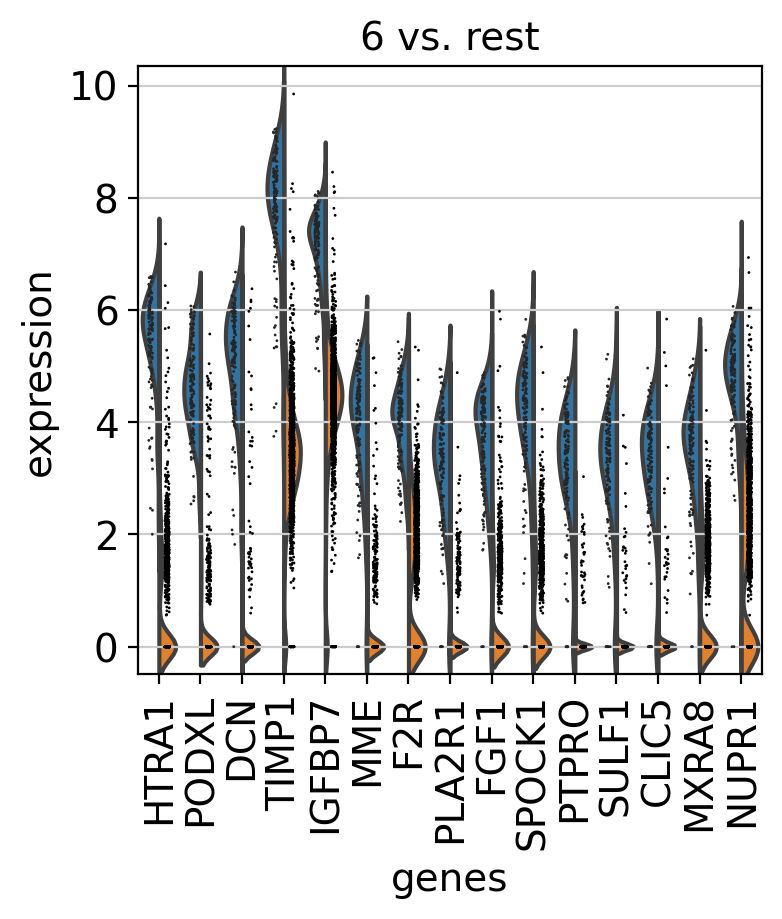

In [71]:
sc.pl.rank_genes_groups_violin(adata, groups='6', n_genes=15, scale = 'width')

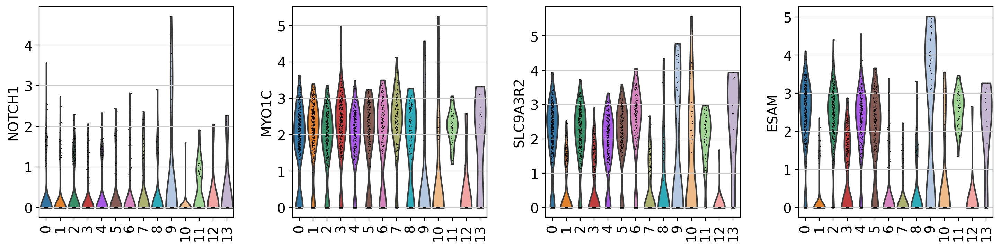

In [72]:
sc.pl.violin(adata, ['NOTCH1','MYO1C','SLC9A3R2','ESAM'], groupby='leiden', rotation = 90, save="mm2.pdf")

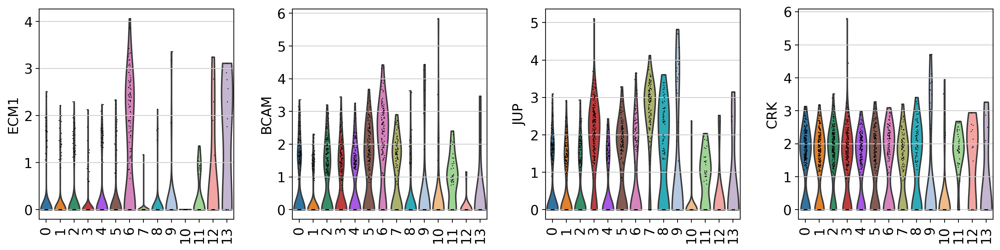

In [73]:
sc.pl.violin(adata, ['ECM1','BCAM','JUP','CRK'], groupby='leiden', rotation = 90, save="mm3.pdf")

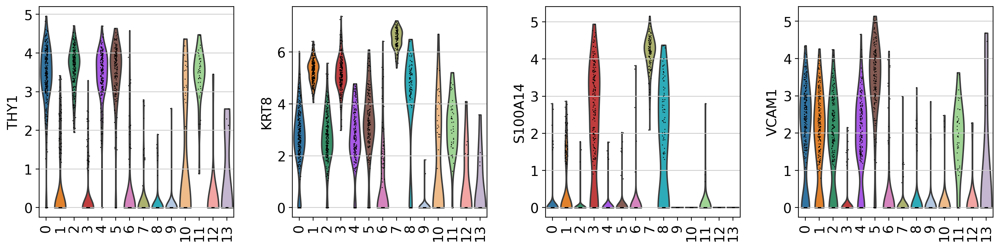

In [75]:
sc.pl.violin(adata, ['THY1', 'KRT8','S100A14', 'VCAM1'], groupby='leiden', rotation = 90)

In [76]:


new_cluster_names = ['MSC/FBB', 'PTC', 'NPC-p', 'CDC', 'EMT', 'PAT','POD','DTC','EPT','END','UKN', 'NPC', 'MAC', 'MES']

adata.rename_categories('leiden', new_cluster_names)



/home/bioinformatics/miniconda3/envs/MSIA/lib/python3.10/site-packages/anndata/_core/anndata.py:1160: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  self.obs[key].cat.rename_categories(categories, inplace=True)


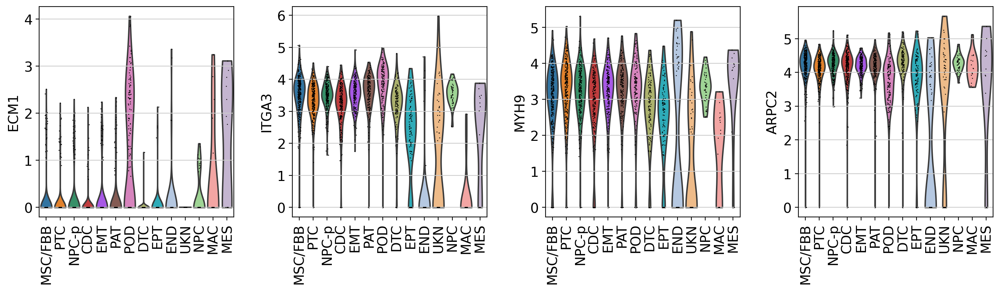

In [77]:
sc.pl.violin(adata, ['ECM1','ITGA3','MYH9','ARPC2'], groupby='leiden', rotation = 90,save="fig5a.pdf")

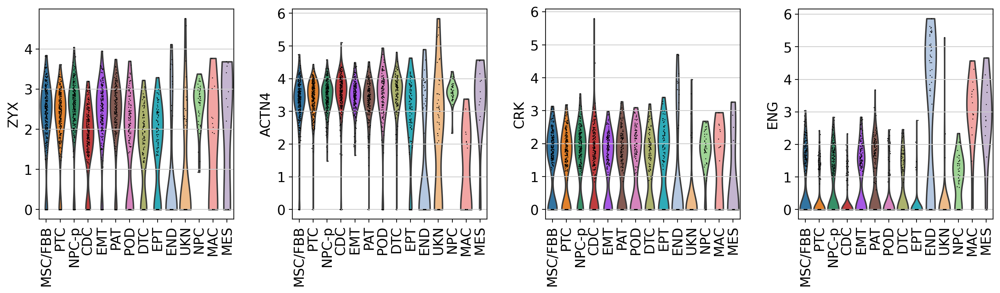

In [78]:
sc.pl.violin(adata, ['ZYX','ACTN4','CRK','ENG'], groupby='leiden', rotation = 90,save="fig5b.pdf")

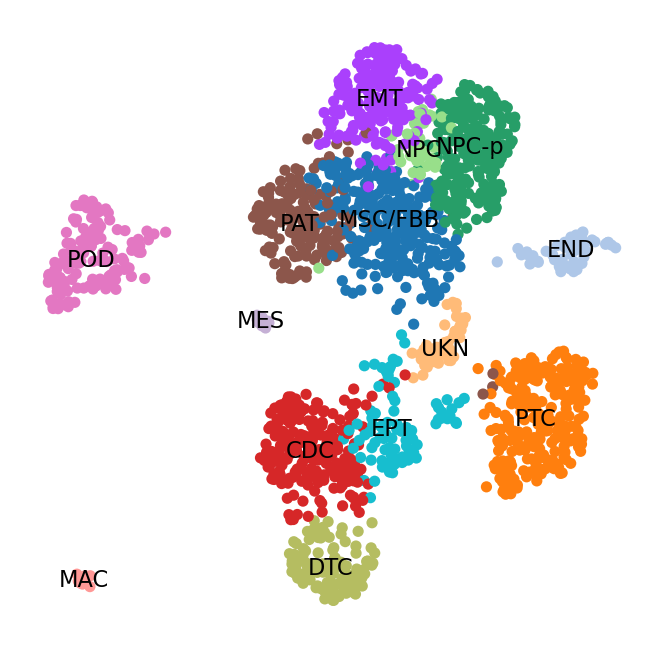

In [83]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='K185_2.pdf', legend_fontsize = 'xx-small', legend_fontweight = 'normal')



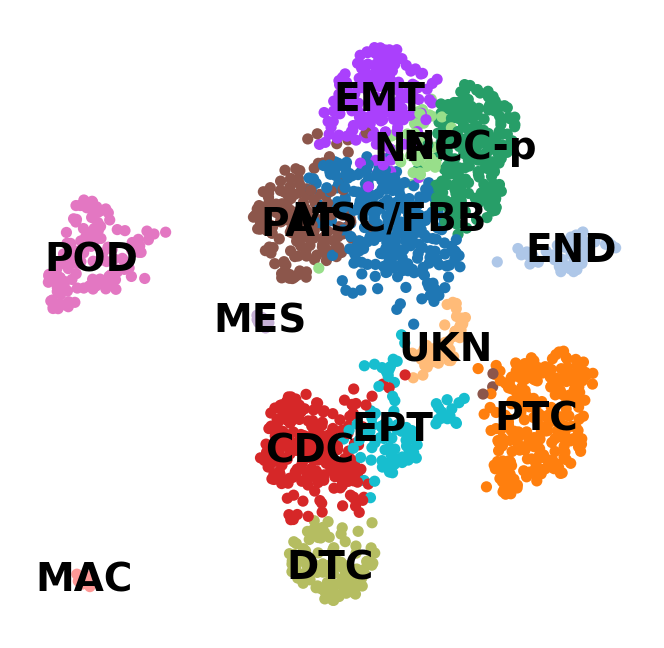

In [80]:
sc.pl.umap(adata, color='leiden', legend_loc='on data', title='', frameon=False, save='K185_1.pdf')

In [84]:
test_marker=['ECM1','ITGA3','MYH9','ARPC2','ZYX','ACTN4','CRK','ENG']

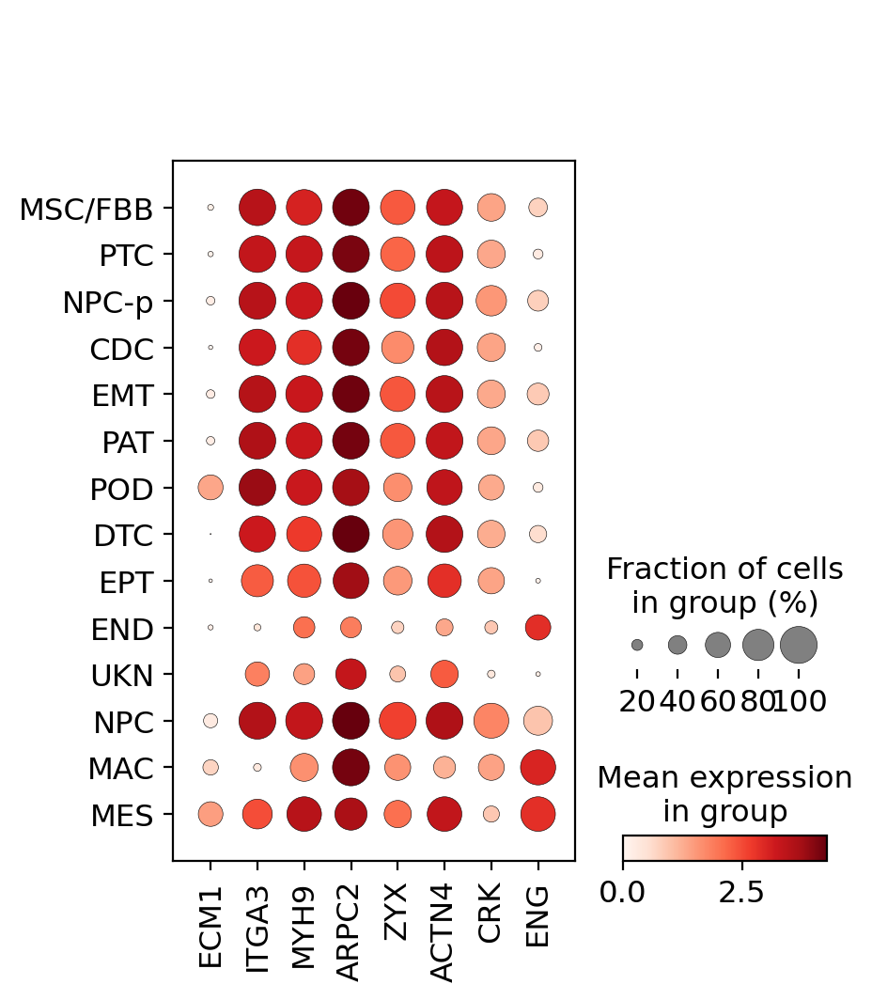

In [85]:
sc.pl.dotplot(adata, test_marker, groupby='leiden', save='keynodes.pdf')

In [106]:
marker_genes = ['SRGN','THY1', 'NNMT', 'ANPEP','CENPF', 'HMGB2','MKI67','CCNB1', 'KRT7', 'EPCAM', 'ATAD2', 'VCAM1', 'PODXL', 'NPHS2', 'KRT8','TACSTD2','SLC3A2', 'PECAM1', 'ESM1', 'TOP2A', 'SHISA2',
               'C1QA', 'C1QC', 'MGP', 'TAGLN']               

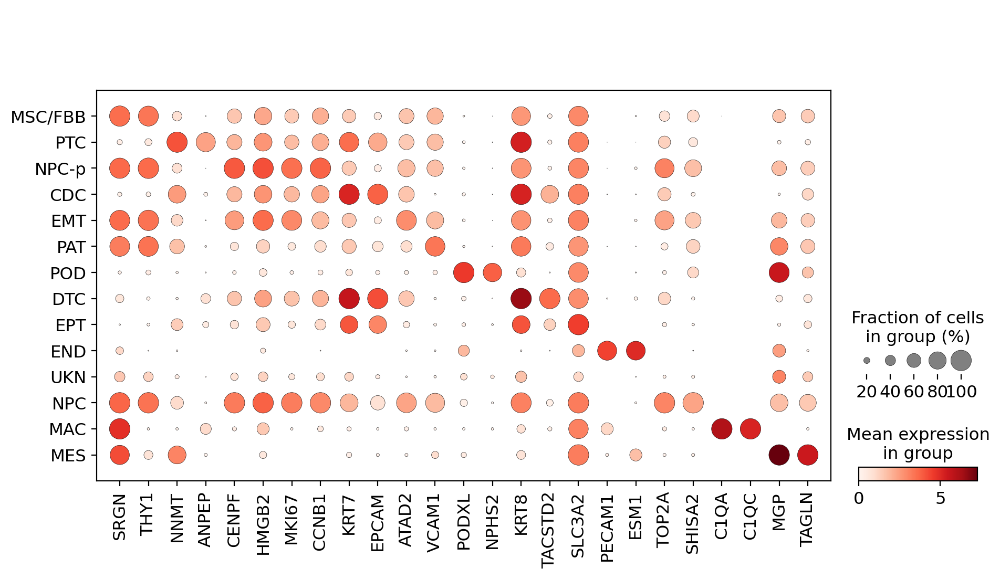

In [107]:
sc.pl.dotplot(adata, marker_genes, groupby='leiden', save='dot185_2.pdf')

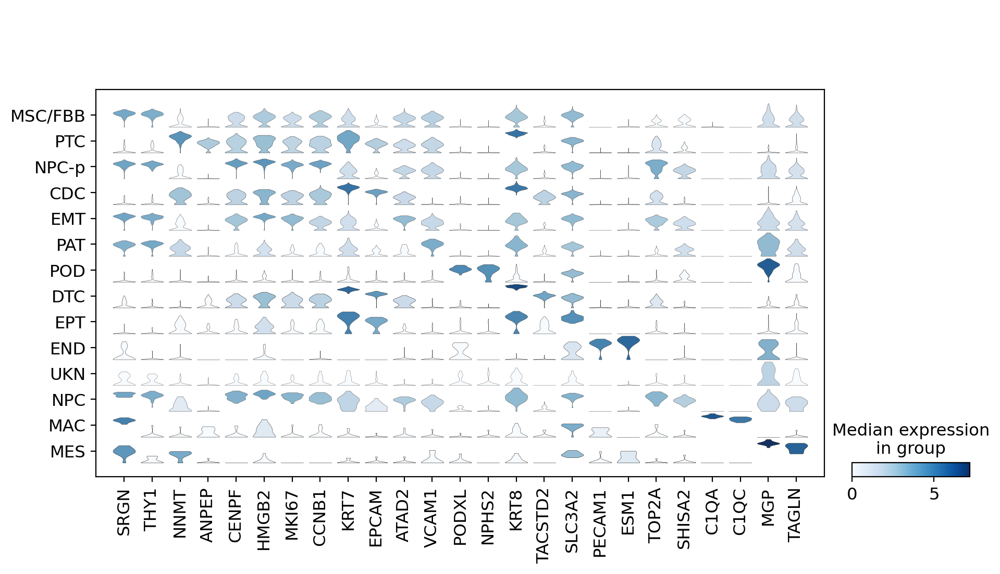

In [108]:
sc.pl.stacked_violin(adata, marker_genes, groupby='leiden', rotation=90, save='violin185_2.pdf')

In [109]:
adata.var

,gene_ids,n_cells,mt,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,highly_variable,means,dispersions,dispersions_norm,mean,std
SAMD11,ENSG00000187634,747,False,747,0.906157,62.909633,1825.0,True,1.602198,2.764683,0.905043,1.070138e-10,1.128092
AL645608.8,ENSG00000272512,173,False,173,0.096822,91.410129,195.0,True,0.418525,3.164522,1.469871,2.786396e-10,0.498545
ISG15,ENSG00000187608,1336,False,1336,2.596822,33.664350,5230.0,True,2.498562,4.919263,4.010509,6.931759e-10,1.216995
TNFRSF4,ENSG00000186827,100,False,100,0.056604,95.034757,114.0,True,0.485200,4.674395,3.668936,6.562164e-11,0.453106
C1QTNF12,ENSG00000184163,83,False,83,0.042701,95.878848,86.0,True,0.165047,2.326343,0.724146,-8.379379e-11,0.313237
...,...,...,...,...,...,...,...,...,...,...,...,...,...
COL18A1,ENSG00000182871,1436,False,1436,2.167825,28.699106,4366.0,True,2.278141,3.104963,1.141746,-3.803019e-10,1.096863
PCBP3,ENSG00000183570,28,False,28,0.014399,98.609732,29.0,True,0.122669,4.654206,3.882854,-3.881694e-11,0.201834
S100B,ENSG00000160307,8,False,8,0.006455,99.602781,13.0,True,0.031759,2.579614,1.067813,-1.319137e-10,0.131596
MT-ATP8,ENSG00000228253,1794,True,1794,4.761668,10.923535,9590.0,True,2.860796,3.248666,0.830700,4.601087e-10,0.983207


In [110]:
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
AAACCCAAGCGTGTCC-1,5908,5905,34001.0,3281.0,9.649716,CDC
AAACGAACAAACACGG-1,4481,4479,22547.0,2753.0,12.210051,EPT
AAACGAATCCCTCTTT-1,209,209,643.0,34.0,5.287714,UKN
AAACGAATCGGACCAC-1,5645,5643,40531.0,3098.0,7.643532,MSC/FBB
AAACGAATCTGTGCTC-1,8632,8627,93888.0,6591.0,7.020067,POD
...,...,...,...,...,...,...
TTTGATCAGTCTCCTC-1,6158,6152,43291.0,2608.0,6.024347,NPC-p
TTTGATCTCGAGTGGA-1,4373,4372,19807.0,1573.0,7.941637,MSC/FBB
TTTGGAGAGTTCAACC-1,4181,4180,15876.0,1333.0,8.396321,CDC
TTTGGAGCAACCGACC-1,6990,6984,56807.0,3728.0,6.562571,PTC
